# Data analysis for fluorescence

Data files comes in matrices having as rows increasing time-steps and as columns
- time 
- continuous FI 11
- continuous FI 12
- continuous FI 22
- FI on conditional state 11
- FI on conditional state 12
- FI on conditional state 22
- QFI 11
- QFI 12
- QFI 22
- absolute value of D 12

In [1]:
using Plots
using DelimitedFiles
using LinearAlgebra

### Homodyne detection

In [2]:
hd = readdlm("Data/Output_Fluorescence_HD.dat");

Components of the Fisher Information for the homodyne detection, Quantum Fisher Information and Fisher Information for the strong measurement on the conditional state

In [3]:
label1 = ["FI_xx" "FIC_xx" "QFI_xx"]
label2 = ["FI_xy" "FIC_xy" "QFI_xy"]
label3 = ["FI_yy" "FIC_yy" "QFI_yy"]

p1 = plot(hd[:,1], [hd[:,2], hd[:,8], hd[:,5]], xlabel = "t", label = label1) 
p2 = plot(hd[:,1], [hd[:,3], hd[:,9], hd[:,6]], xlabel = "t", label = label2) 
p3 = plot(hd[:,1], [hd[:,4], hd[:,10], hd[:,7]], xlabel = "t", label = label3) 
plot(p1, p2, p3, layout = (3,1), xlim = (0,7))

Module of the Uhlmann curvature

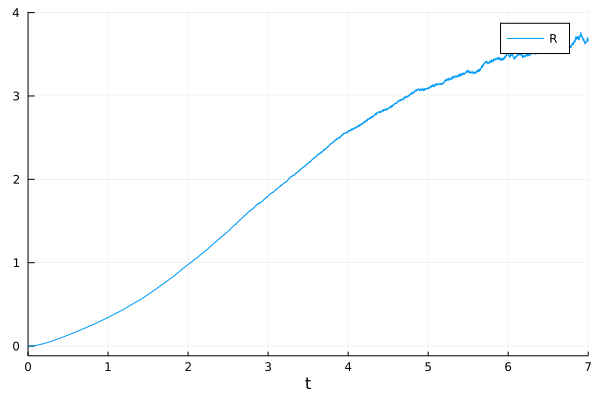

In [4]:
p = plot(hd[:,1], hd[:,11], xlabel = "t", label = "R", xlim = (0,7))
plot(p)

### Heterodyne detection

In [5]:
hed = readdlm("Data/Output_Fluorescence_HED.dat");

Components of the Fisher Information for the heterodyne detection, Quantum Fisher Information and Fisher Information for the strong measurement on the conditional state

In [6]:
p1 = plot(hed[:,1], [hed[:,2], hed[:,8], hed[:,5]], xlabel = "t", label = label1) 
p2 = plot(hed[:,1], [hed[:,3], hed[:,9], hed[:,6]], xlabel = "t", label = label2) 
p3 = plot(hed[:,1], [hed[:,4], hed[:,10], hed[:,7]], xlabel = "t", label = label3) 
plot(p1, p2, p3, layout = (3,1), xlim = (0,7))

Module of the Uhlmann curvature

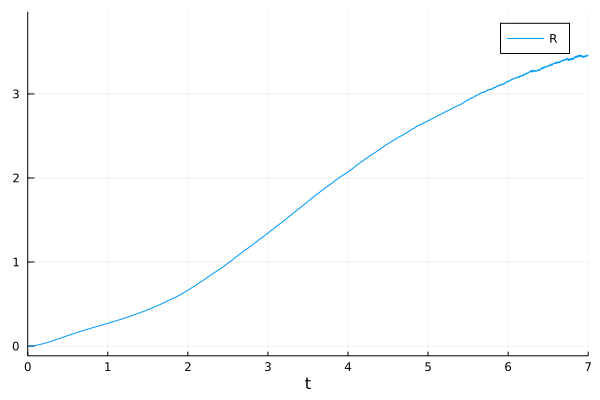

In [7]:
p = plot(hed[:,1], hed[:,11], xlabel = "t", label = "R", xlim = (0,7))
plot(p)

### Photodetection

In [8]:
pd = readdlm("Data/Output_Fluorescence_PD.dat");

Components of the Fisher Information for the photodetection, Quantum Fisher Information and Fisher Information for the strong measurement on the conditional state

In [9]:
p1 = plot(pd[:,1], [pd[:,2], pd[:,8], pd[:,5]], xlabel = "t", label = label1) 
p2 = plot(pd[:,1], [pd[:,3], pd[:,9], pd[:,6]], xlabel = "t", label = label2) 
p3 = plot(pd[:,1], [pd[:,4], pd[:,10], pd[:,7]], xlabel = "t", label = label3) 
plot(p1, p2, p3, layout = (3,1), xlim = (0,7))

Module of the Uhlmann curvature

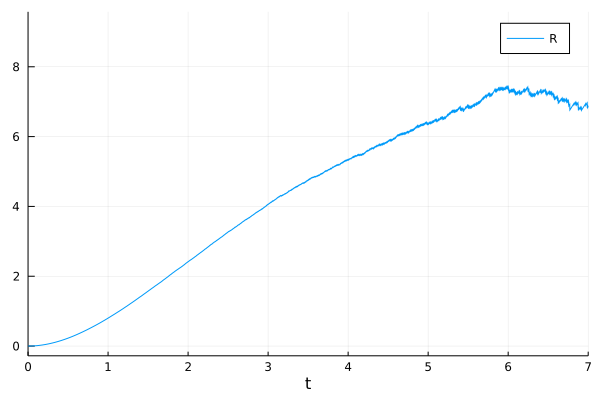

In [10]:
p = plot(pd[:,1], pd[:,11], xlabel = "t", label = "R", xlim = (0,7))
plot(p)

### Comparison of the different strategies

In [11]:
dt = 0.0005
Nfinal = 10.
Ntime = Int(floor(Nfinal/dt))

CQ_HeD = zeros(Ntime)
CQ_HD = zeros(Ntime)
CQ_PD = zeros(Ntime)
CF_HeD = zeros(Ntime)
CF_HD = zeros(Ntime)
CF_PD = zeros(Ntime)
Molmer = zeros(Ntime)
T_HeD = zeros(Ntime)
T_HD = zeros(Ntime)
T_PD = zeros(Ntime)
R_HeD = zeros(Ntime)
R_HD = zeros(Ntime)
R_PD = zeros(Ntime)

for jt = 1 : Ntime
    Qeff_HD = ([hd[jt,2]+hd[jt,8] hd[jt,3]+hd[jt,9]; hd[jt,3]+hd[jt,9] hd[jt,4]+hd[jt,10]])
    Feff_HD = ([hd[jt,2]+hd[jt,5] hd[jt,3]+hd[jt,6]; hd[jt,3]+hd[jt,6] hd[jt,4]+hd[jt,7]])  
    Qeff_PD = ([pd[jt,2]+pd[jt,8] pd[jt,3]+pd[jt,9]; pd[jt,3]+pd[jt,9] pd[jt,4]+pd[jt,10]])
    Feff_PD = ([pd[jt,2]+pd[jt,5] pd[jt,3]+pd[jt,6]; pd[jt,3]+pd[jt,6] pd[jt,4]+pd[jt,7]])
    Qeff_HeD = ([hed[jt,2]+hed[jt,8] hed[jt,3]+hed[jt,9]; hed[jt,3]+hed[jt,9] hed[jt,4]+hed[jt,10]])  
    Feff_HeD = ([hed[jt,2]+hed[jt,5] hed[jt,3]+hed[jt,6]; hed[jt,3]+hed[jt,6] hed[jt,4]+hed[jt,7]])
    MQI = ([4*(-2+2exp(-jt*dt/2)+jt*dt) 0; 0 4*(-2+2exp(-jt*dt/2)+jt*dt)])
    CQ_HD[jt] = 1/tr(inv(Qeff_HD))
    CF_HD[jt] = 1/tr(inv(Feff_HD))
    CQ_PD[jt] = 1/tr(inv(Qeff_PD))
    CF_PD[jt] = 1/tr(inv(Feff_PD))
    CQ_HeD[jt] = 1/tr(inv(Qeff_HeD))
    CF_HeD[jt] = 1/tr(inv(Feff_HeD))
    Molmer[jt] = 1/tr(inv(MQI))
    T_HD[jt] = CF_HD[jt]/CQ_HD[jt]
    T_PD[jt] = CF_PD[jt]/CQ_PD[jt]
    T_HeD[jt] = CF_HeD[jt]/CQ_HeD[jt]
    R_HD[jt] = hd[jt,11]/sqrt(det(Qeff_HD))
    R_PD[jt] = pd[jt,11]/sqrt(det(Qeff_PD))
    R_HeD[jt] = hed[jt,11]/sqrt(det(Qeff_HeD))
end

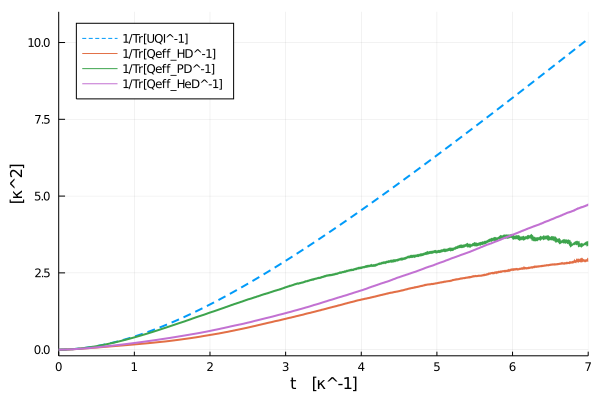

In [12]:
styles = filter((s->begin
                s in Plots.supported_styles()
            end), [:dash, :solid, :solid, :solid])
styles = reshape(styles, 1, length(styles))

label_ult = ["1/Tr[UQI^-1]" "1/Tr[Qeff_HD^-1]" "1/Tr[Qeff_PD^-1]" "1/Tr[Qeff_HeD^-1]"]
p_ult = plot(hd[:,1], [Molmer, CQ_HD, CQ_PD, CQ_HeD], line = (2, styles), xlabel = "t   [κ^-1]", ylabel = "[κ^2]", label = label_ult, xlim = (0,7),  ylim = (-0.2,11)) 
plot(p_ult,legend = :topleft)
#savefig("ultimate_fluorescence.png")

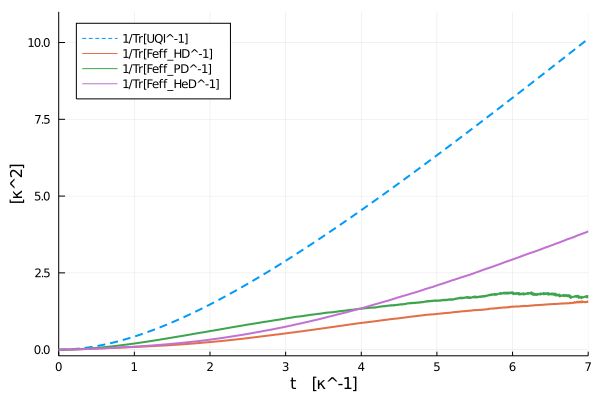

In [13]:
label_ult = ["1/Tr[UQI^-1]" "1/Tr[Feff_HD^-1]" "1/Tr[Feff_PD^-1]" "1/Tr[Feff_HeD^-1]"]
p_ult = plot(hd[:,1], [Molmer, CF_HD, CF_PD, CF_HeD], line = (2, styles), xlabel = "t   [κ^-1]", ylabel = "[κ^2]", label = label_ult, xlim = (0,7),  ylim = (-0.2,11)) 
plot(p_ult,legend = :topleft)
#savefig("ultimate_fluorescence_FI.png")

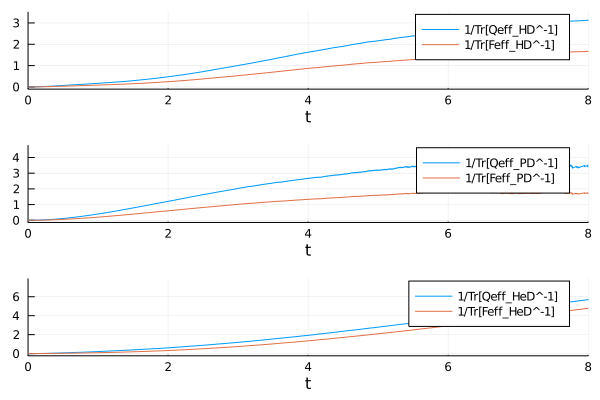

In [14]:
label4 = ["1/Tr[Qeff_HD^-1]" "1/Tr[Feff_HD^-1]"]
label5 = ["1/Tr[Qeff_PD^-1]" "1/Tr[Feff_PD^-1]"]
label6 = ["1/Tr[Qeff_HeD^-1]" "1/Tr[Feff_HeD^-1]"]

p4 = plot(hd[:,1], [CQ_HD, CF_HD], xlabel = "t", label = label4) 
p5 = plot(pd[:,1], [CQ_PD, CF_PD], xlabel = "t", label = label5) 
p6 = plot(hed[:,1], [CQ_HeD, CF_HeD], xlabel = "t", label = label6) 
plot(p4, p5, p6, layout = (3,1), xlim = (0,8))

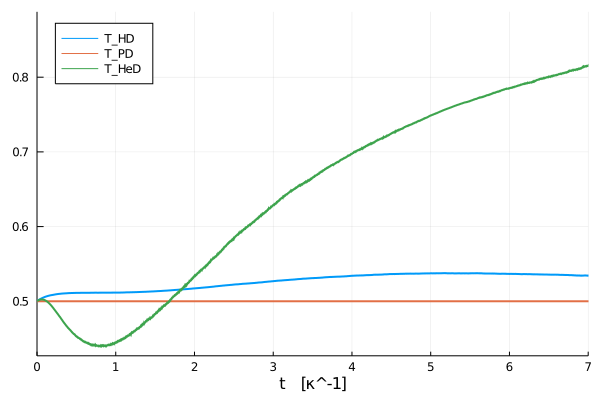

In [15]:
label_t = ["T_HD" "T_PD" "T_HeD"]
p_t = plot(hd[:,1], [T_HD, T_PD, T_HeD], line = (2), xlabel = "t   [κ^-1]", label = label_t, xlim = (0,7)) 
plot(p_t, legend = :topleft)
#savefig("t_fluorescence.png")

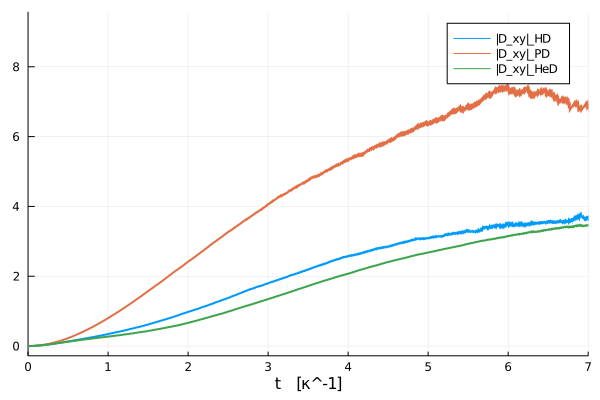

In [16]:
label_u = ["|D_xy|_HD" "|D_xy|_PD" "|D_xy|_HeD"]
p_u = plot(hd[:,1], [hd[:,11], pd[:,11], hed[:,11]], line = (2), xlabel = "t   [κ^-1]", label = label_u, xlim = (0,7)) 
plot(p_u)
#savefig("ulhmann_fluorescence.png")

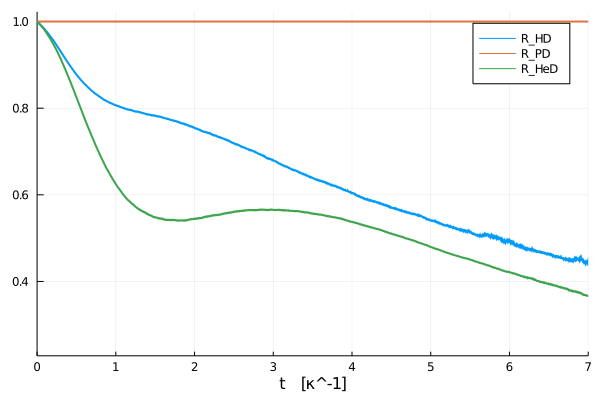

In [17]:
label_r = ["R_HD" "R_PD" "R_HeD"]
p_r = plot(hd[:,1], [R_HD, R_PD, R_HeD], line = (2), xlabel = "t   [κ^-1]", label = label_r, xlim = (0,7)) 
plot(p_r)
#savefig("r_fluorescence.png")